In [1]:
from STMdatabase import STMdatabase as database
from STMdatabase import STMimage,STMspec,STMgrid
from os.path import join
from matplotlib import pyplot as plt
from skimage.metrics import structural_similarity as ssim
import numpy as np
import math
from os import listdir,path

In [2]:
databaseName="../../STMdata.db"
myDir="../../../STMdata"
mydatabase=database(databaseName)

In [17]:
myFolder="20230223"
myFileName="SiC053.sxm"

myPath=join(myDir,myFolder,myFileName)
print(myPath)

../../../STMdata/20230223/SiC053.sxm


In [ ]:
sql="SELECT * FROM STMdataLists , STMimageLabel WHERE STMdataLists.List_ID = STMimageLabel.List_ID AND STMdataLists.List_ID <10 "
print(sql)
fectch=mydatabase.execute_sql_fetchall(sql)
print(fectch[1][3])

In [3]:
print(mydatabase.STMIMAGELABEL)
print(mydatabase.DATA_LIST_NAME)
print(mydatabase.IMAGE_LABEL)

{'Data_ID': 1, 'Info_ID': 1, 'List_ID': 1, 'TIME_STAMP': 100.0, 'PosX_nm': 328.0, 'PosY_nm': 328.0, 'Image_pix': 512, 'Image_size': 20, 'Channel': 1, 'Range': '1 2 3 4', 'Image_quality': 5, 'Image_type': 2, 'forward_SNR': 6.45, 'backward_SNR': 6.05, 'ssim_value': 0.44, 'psnr_value': 24.35}
STMdataLists
STMimageLabel


In [19]:
sql="SELECT * from {0}  where List_ID=50".format(mydatabase.DATA_LIST_NAME,mydatabase.IMAGE_LABEL)

sql="SELECT * FROM STMdataLists , STMimageLabel WHERE STMdataLists.List_ID = STMimageLabel.List_ID AND STMdataLists.UpdateFilePath='{0}'".format(myPath)
print(sql)
fectch=mydatabase.execute_sql_fetchall(sql)
print(fectch)

SELECT * FROM STMdataLists , STMimageLabel WHERE STMdataLists.List_ID = STMimageLabel.List_ID AND STMdataLists.UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
SUCCESS---------SELECT * FROM STMdataLists , STMimageLabel WHERE STMdataLists.List_ID = STMimageLabel.List_ID AND STMdataLists.UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
[(5652, 'SiC053', 1680145677.0, '../../../STMdata/20230223/SiC053.sxm', '30.03.2023', '14:07:57', -2.5, 30.0, 'sxm', 325.269, -126.619, 3942, 3942, 3942, 5652, 1680145677.0, 325.269, -126.619, 512, 20, 1, '315.269 335.269 -136.619 -116.619', 3.2, 3.56, 0.3196340054121545, 20.65116202249786, -1, -1)]


In [ ]:
sql="SELECT * FROM STMdataLists , STMimageLabel WHERE STMdataLists.List_ID = STMimageLabel.List_ID AND 315.269<STMdataLists.PosX_nm<335.269 AND -136.619<STMdataLists.PosY_nm-116.619"
print(sql)
fectch=mydatabase.execute_sql_fetchall(sql)
print(fectch)

In [27]:
sql="SELECT  STMdataLists.Date  FROM STMdataLists , STMimageLabel WHERE STMdataLists.List_ID = STMimageLabel.List_ID AND STMdataLists.UpdateFilePath='{0}'".format(myPath)
Date=mydatabase.execute_sql_fetchone(sql)
print(Date)

SUCCESS---------SELECT  STMdataLists.Date  FROM STMdataLists , STMimageLabel WHERE STMdataLists.List_ID = STMimageLabel.List_ID AND STMdataLists.UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
30.03.2023


In [30]:
sql="SELECT STMdataLists.UpdateFilePath FROM STMdataLists WHERE STMdataLists.Date= '{0}'".format(Date)
print(sql)
fectch=mydatabase.execute_sql_fetchall(sql)
print(fectch)

SELECT STMdataLists.UpdateFilePath FROM STMdataLists WHERE STMdataLists.Date= '30.03.2023'
SUCCESS---------SELECT STMdataLists.UpdateFilePath FROM STMdataLists WHERE STMdataLists.Date= '30.03.2023'
[('../../../STMdata/20230223/SiC051.sxm',), ('../../../STMdata/20230223/SiC052.sxm',), ('../../../STMdata/20230223/SiC053.sxm',), ('../../../STMdata/20230223/Bias-Spectroscopy001.dat',), ('../../../STMdata/20230223/Grid Spectroscopy002.3ds',), ('../../../STMdata/20230223/Bias-Spectroscopy002.dat',), ('../../../STMdata/20230223/Bias-Spectroscopy003.dat',), ('../../../STMdata/20230223/Bias-Spectroscopy004.dat',), ('../../../STMdata/20230223/Bias-Spectroscopy005.dat',), ('../../../STMdata/20230223/Bias-Spectroscopy006.dat',), ('../../../STMdata/20230223/SiC054.sxm',), ('../../../STMdata/20230223/Bias-Spectroscopy007.dat',), ('../../../STMdata/20230223/Bias-Spectroscopy008.dat',), ('../../../STMdata/20230223/Bias-Spectroscopy009.dat',), ('../../../STMdata/20230223/Bias-Spectroscopy010.dat',), ('

In [12]:

def update_imageInfo_list(mydir="../../../STMdata",databaseName="../../STMdata.db"):
    myFiledirs=[join(mydir,Fold) for Fold in listdir(mydir)]
    myFiledirs.sort(key=path.getmtime)
    mydatabase=database(databaseName)
    for mydir in myFiledirs[:-1]:
        myfiles=[join(mydir,Fold) for Fold in listdir(mydir)]
        myfiles.sort(key=path.getmtime)
        for j, myfile in enumerate(myfiles):
            if myfile.endswith(".sxm"):
                myImage=STMimage(filePath=myfile,DatabaseName=databaseName) 
                STM_image_Label=myImage.get_data_label()
                mydatabase.insert_image_label_table(STMdateList=STM_image_Label)

In [14]:
update_imageInfo_list(mydir="../../../STMdata",databaseName="../../STMdata.db")

SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20220608/Ag(111)#1001.sxm'
SUCCESS---------SELECT PosX_nm  from STMdataLists  WHERE UpdateFilePath='../../../STMdata/20220608/Ag(111)#1001.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20220608/Ag(111)#1001.sxm'
SUCCESS---------SELECT PosY_nm from STMdataLists  WHERE UpdateFilePath='../../../STMdata/20220608/Ag(111)#1001.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20220608/Ag(111)#1001.sxm'
SUCCESS---------SELECT TimeStamp FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20220608/Ag(111)#1001.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20220608/Ag(111)#1001.sxm'
SUCCESS---------SELECT Info_ID FROM STMimageInfo WHERE List_ID=1
Z_forward
Z_backward
Current_forward
Current_backward
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='

In [13]:
mydatabase.drop_creat_image_label_table()
mydatabase.drop_creat_spec_label_table()

SUCCESS---------DROP TABLE IF EXISTS STMimageLabel
STMimageLabel table is droped
SUCCESS--------- CREATE TABLE IF NOT EXISTS STMimageLabel ( 
                                        Label_ID   INTEGER PRIMARY KEY AUTOINCREMENT,
                                        Data_ID INTEGER,
                                        Info_ID INTEGER,
                                        List_ID INTEGER,
                                        TIME_STAMP  REAL,
                                        PosX_nm  REAL,
                                        PosY_nm  REAL,
                                        Image_pix INTEGER,
                                        Image_size INTEGER,
                                        Channel INTEGER,
                                        Range  TEXT,
                                        forward_SNR REAL,
                                        backward_SNR REAL,
                                        ssim_value REAL,
                              

In [9]:
mydir,myFolder,fileName="../../../STMdata","20230223","SiC053.sxm"
filePath=join(mydir,myFolder,fileName)
myImage=STMimage(filePath=filePath,DatabaseName=databaseName)
STM_image_Label=myImage.get_data_label()
print("the data label is ",STM_image_Label)
mydatabase.insert_image_label_table(STMdateList=STM_image_Label)

SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
SUCCESS---------SELECT PosX_nm  from STMdataLists  WHERE UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
SUCCESS---------SELECT PosY_nm from STMdataLists  WHERE UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
SUCCESS---------SELECT TimeStamp FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
SUCCESS---------SELECT Info_ID FROM STMimageInfo WHERE List_ID=5652
Z_forward
Z_backward
LIY_1_omega_forward
LIY_1_omega_backward
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20230223/SiC05

SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
SUCCESS---------SELECT SCAN_PIXELS from STMimageInfo WHERE List_ID=5652
SUCCESS---------SELECT Z_forward from STMimageValue WHERE List_ID=5652
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20230223/SiC053.sxm'
SUCCESS---------SELECT SCAN_PIXELS from STMimageInfo WHERE List_ID=5652
SUCCESS---------SELECT Z_backward from STMimageValue WHERE List_ID=5652


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Library/Frameworks/Pyt

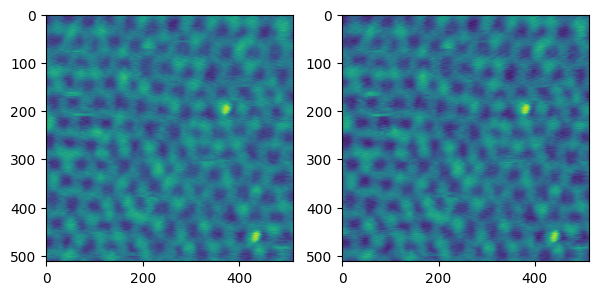

In [5]:
fig,ax=plt.subplots(1,2,figsize=(7,15))
image_for=myImage.correct_line(channel="Z_forward")
image_back=myImage.correct_line(channel="Z_backward")

ax[1].imshow(image_for)
ax[0].imshow(image_back[::,::-1])
image_for=(image_for-image_for.min())/(image_for.max()-image_for.min())
image_back=(image_back-image_back.min())/(image_back.max()-image_back.min())



In [12]:


def calculate_snr(image):
    signal = np.mean(image)
    noise = np.std(image)
    snr = signal / noise
    return snr
def calculate_psnr(image1,image2):
    mse = np.mean((image1 - image2) ** 2)
    if mse == 0:
        return -1
    return 10 * math.log10(1. / mse)



In [47]:
snr_value = calculate_snr(image_for)
print(f'forward_SNR: {snr_value:.2f}')

snr_value = calculate_snr(image_back[::,::-1])
print(f'Z_backward_SNR: {snr_value:.2f}')

ssim_value=ssim(image_for,image_back[::,::-1],data_range=image_for.max()-image_for.min())

print(f'ssim_value: {ssim_value:.2f}')
psnr_value=calculate_psnr(image_for,image_back[::,::-1])

print(f'psnr_value: {psnr_value:.2f}')

forward_SNR: 3.04
Z_backward_SNR: 3.31
ssim_value: 0.33
psnr_value: 20.74


In [8]:
mydir,myFolder,fileName="../../../STMdata","20221207","SiC011.sxm"
filePath=join(mydir,myFolder,fileName)

In [9]:
myImage=STMimage(filePath=filePath,DatabaseName=databaseName)
STM_image_Label=myImage.get_data_label()
print("the data label is ",STM_image_Label)
mydatabase.insert_image_label_table(STMdateList=STM_image_Label)

SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20221207/SiC011.sxm'
SUCCESS---------SELECT PosX_nm  from STMdataLists  WHERE UpdateFilePath='../../../STMdata/20221207/SiC011.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20221207/SiC011.sxm'
SUCCESS---------SELECT PosY_nm from STMdataLists  WHERE UpdateFilePath='../../../STMdata/20221207/SiC011.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20221207/SiC011.sxm'
SUCCESS---------SELECT TimeStamp FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20221207/SiC011.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20221207/SiC011.sxm'
SUCCESS---------SELECT Info_ID FROM STMimageInfo WHERE List_ID=4125
Z_forward
Z_backward
Current_forward
Current_backward
LIY_1_omega_forward
LIY_1_omega_backward
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath

SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20221207/SiC011.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20221207/SiC011.sxm'
SUCCESS---------SELECT SCAN_PIXELS from STMimageInfo WHERE List_ID=4125
SUCCESS---------SELECT Z_forward from STMimageValue WHERE List_ID=4125
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20221207/SiC011.sxm'
SUCCESS---------SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='../../../STMdata/20221207/SiC011.sxm'
SUCCESS---------SELECT SCAN_PIXELS from STMimageInfo WHERE List_ID=4125
SUCCESS---------SELECT Z_backward from STMimageValue WHERE List_ID=4125


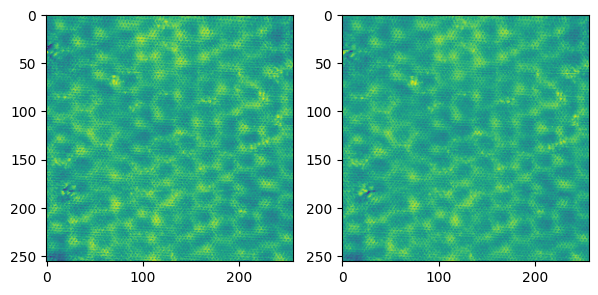

In [10]:
fig,ax=plt.subplots(1,2,figsize=(7,15))
image_for=myImage.correct_line(channel="Z_forward")
image_back=myImage.correct_line(channel="Z_backward")

 

ax[1].imshow(image_for)
ax[0].imshow(image_back[::,::-1])
image_for=(image_for-image_for.min())/(image_for.max()-image_for.min())
image_back=(image_back-image_back.min())/(image_back.max()-image_back.min())

In [13]:
snr_value = calculate_snr(image_for)
print(f'forward_SNR: {snr_value:.2f}')

snr_value = calculate_snr(image_back[::,::-1])
print(f'Z_backward_SNR: {snr_value:.2f}')

ssim_value=ssim(image_for,image_back[::,::-1],data_range=image_for.max()-image_for.min())

print(f'ssim_value: {ssim_value:.2f}')
psnr_value=calculate_psnr(image_for,image_back[::,::-1])

print(f'psnr_value: {psnr_value:.2f}')

forward_SNR: 7.46
Z_backward_SNR: 6.88
ssim_value: 0.40
psnr_value: 22.46
